In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)


In [3]:
import os
import glob
import random
import matplotlib.pyplot as plt

# Increase plot size for better visibility
plt.rcParams['figure.figsize'] = (10, 6)

# Path to the extracted dataset directory:
DATASET_PATH = "/kaggle/input/fruit-and-vegetable-image-recognition/train"
# For example: DATASET_PATH = "/kaggle/input/fruit-and-vegetable-image-recognition/train"


In [4]:
# Search for all image files in the directory
image_paths = glob.glob(os.path.join(DATASET_PATH, "*", "*.*"))

total_images = len(image_paths)
print(f"Total number of images in the dataset: {total_images}")


Total number of images in the dataset: 3115


Number of classes: 36
Class 'apple': 68 images
Class 'banana': 75 images
Class 'beetroot': 88 images
Class 'bell pepper': 90 images
Class 'cabbage': 92 images
Class 'capsicum': 89 images
Class 'carrot': 82 images
Class 'cauliflower': 79 images
Class 'chilli pepper': 87 images
Class 'corn': 87 images
Class 'cucumber': 94 images
Class 'eggplant': 84 images
Class 'garlic': 92 images
Class 'ginger': 68 images
Class 'grapes': 100 images
Class 'jalepeno': 88 images
Class 'kiwi': 88 images
Class 'lemon': 82 images
Class 'lettuce': 97 images
Class 'mango': 86 images
Class 'onion': 94 images
Class 'orange': 69 images
Class 'paprika': 83 images
Class 'pear': 89 images
Class 'peas': 100 images
Class 'pineapple': 99 images
Class 'pomegranate': 79 images
Class 'potato': 77 images
Class 'raddish': 81 images
Class 'soy beans': 97 images
Class 'spinach': 97 images
Class 'sweetcorn': 91 images
Class 'sweetpotato': 69 images
Class 'tomato': 92 images
Class 'turnip': 98 images
Class 'watermelon': 84 imag

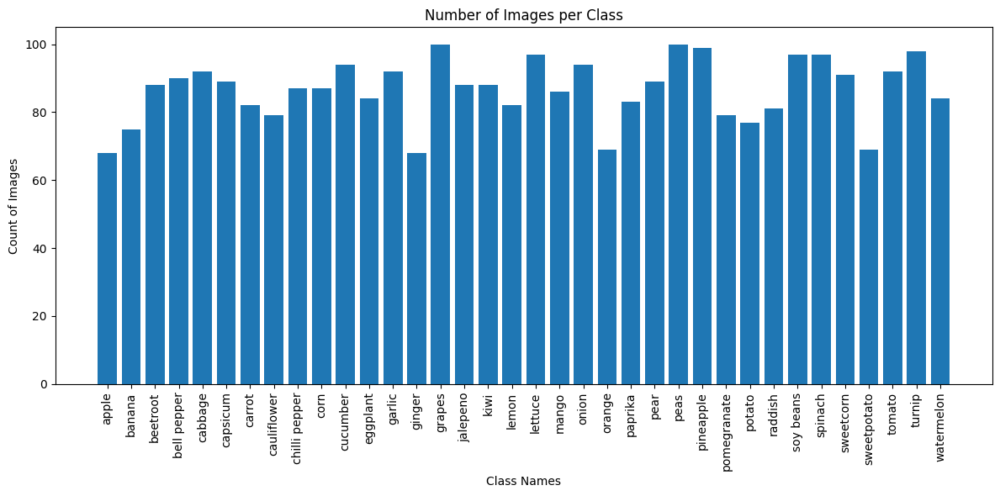

In [5]:
# List all subdirectories (each subdirectory = one class)
class_names = sorted([
    d for d in os.listdir(DATASET_PATH) 
    if os.path.isdir(os.path.join(DATASET_PATH, d))
])

num_classes = len(class_names)
print(f"Number of classes: {num_classes}")

# Dictionary for storing counts per class
class_counts = {}

for class_name in class_names:
    class_dir = os.path.join(DATASET_PATH, class_name)
    # Count number of images in each class folder
    class_counts[class_name] = len(os.listdir(class_dir))

# Print class names and counts
for cls, cnt in class_counts.items():
    print(f"Class '{cls}': {cnt} images")

# Plot histogram of the class distribution
plt.figure(figsize=(12, 6))
plt.bar(class_counts.keys(), class_counts.values())
plt.xticks(rotation=90)
plt.title("Number of Images per Class")
plt.xlabel("Class Names")
plt.ylabel("Count of Images")
plt.tight_layout()
plt.show()


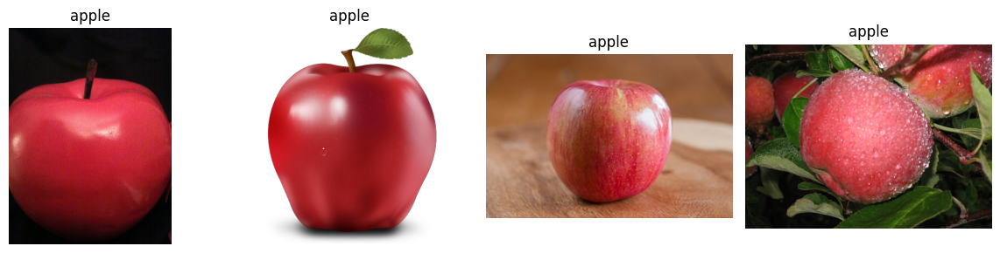

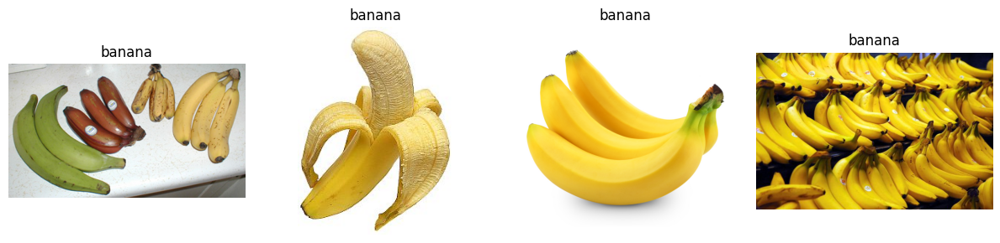

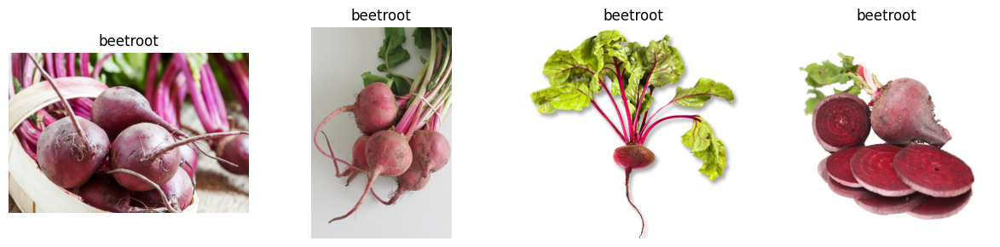

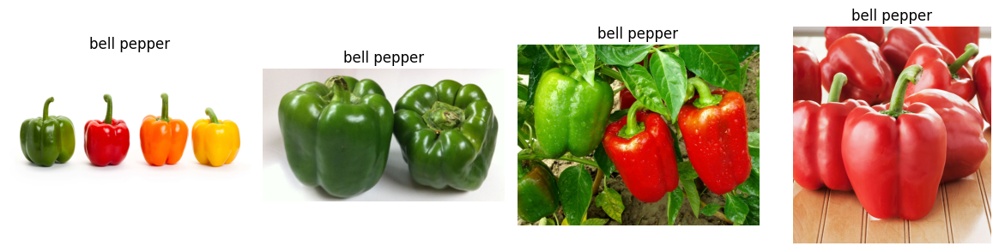

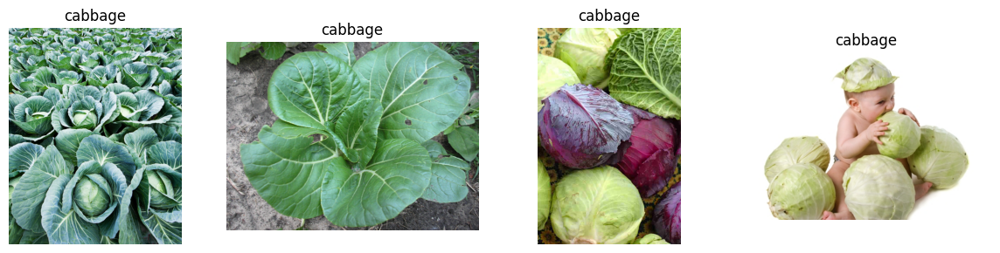

...

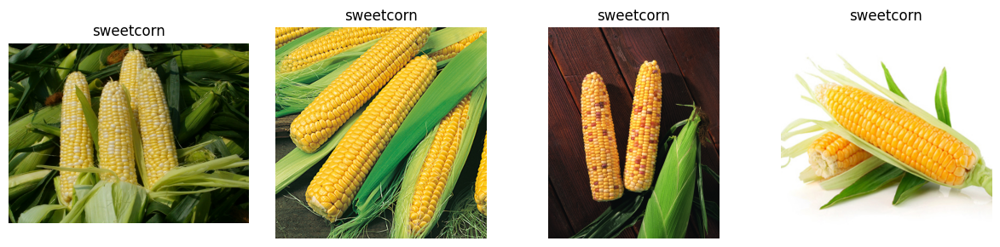

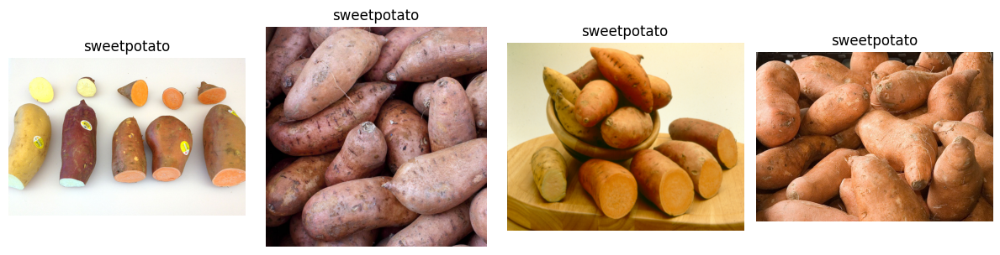

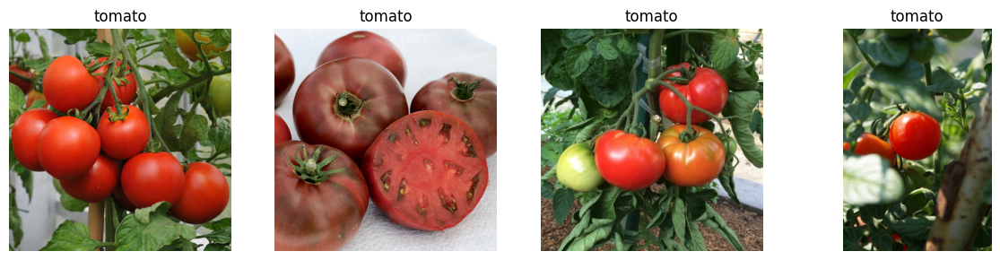

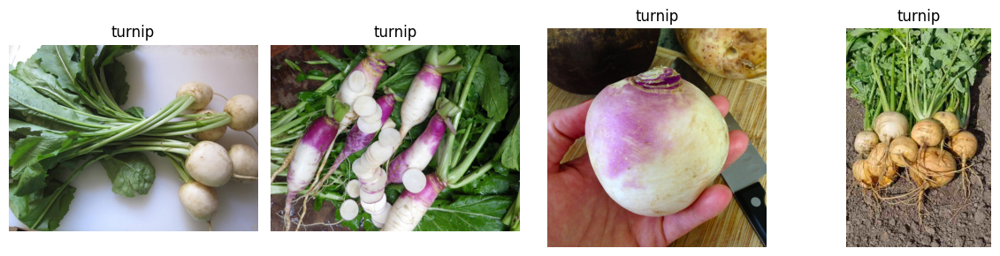

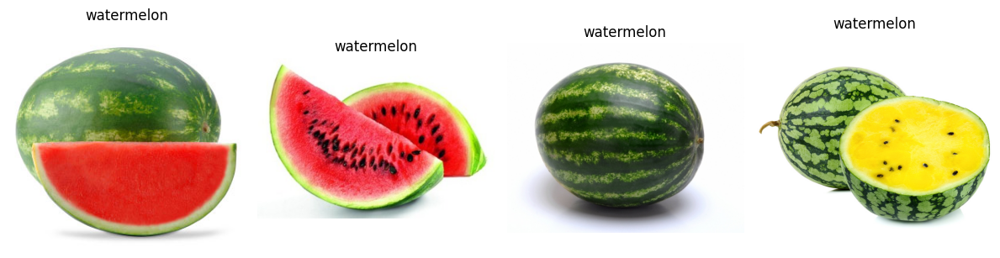

In [4]:
for class_name in class_names:
    class_dir = os.path.join(DATASET_PATH, class_name)
    all_images = os.listdir(class_dir)
    
    # If there are fewer than 4 images, just sample all
    n_to_show = min(4, len(all_images))
    sample_images = random.sample(all_images, n_to_show)
    
    # Create a figure per class
    plt.figure(figsize=(12, 3))
    for i, img_name in enumerate(sample_images):
        img_path = os.path.join(class_dir, img_name)
        image = plt.imread(img_path)
        
        plt.subplot(1, n_to_show, i+1)
        plt.imshow(image)
        plt.title(class_name)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Remove the break below if you want to see images for ALL classes.
    # Otherwise, this break will just show the first few classes for brevity.
    # break


In [5]:
# PyTorch
import torch
print("GPU is available:", torch.cuda.is_available())

# TensorFlow
import tensorflow as tf
print("Available physical devices:", tf.config.list_physical_devices('GPU'))

GPU is available: True
Available physical devices: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]


In [16]:
import os
import tensorflow as tf
import matplotlib.pyplot as plt

# Example directory structure
TRAIN_DIR = "/kaggle/input/fruit-and-vegetable-image-recognition/train"
VALID_DIR = "/kaggle/input/fruit-and-vegetable-image-recognition/validation"  # or test
TEST_DIR = "/kaggle/input/fruit-and-vegetable-image-recognition/test"

IMG_SIZE = (150, 150)  # We'll resize images to 150x150
BATCH_SIZE = 8


In [17]:
# Train dataset
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    TRAIN_DIR,
    seed=42,                       # for reproducible shuffling
    image_size=IMG_SIZE,           # resize images to this size
    batch_size=BATCH_SIZE,         
    label_mode="categorical"       # or "sparse" if you prefer integer class labels
)

# Validation dataset
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    VALID_DIR,
    seed=42,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode="categorical"
)

# Test dataset (if available)
test_ds = tf.keras.preprocessing.image_dataset_from_directory(
    TEST_DIR,
    seed=42,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode="categorical"
)

Found 3115 files belonging to 36 classes.
Found 351 files belonging to 36 classes.
Found 359 files belonging to 36 classes.


In [18]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)


In [19]:
from tensorflow.keras import layers, models

def create_cnn_model(
    input_shape=(150, 150, 3), 
    num_classes=10,
    num_conv_blocks=2,     # how many Conv->Pool blocks
    filters=32,            # number of filters in the first block, we might double each block
    kernel_size=(3,3),
    dropout_rate=0.0
):
    model = models.Sequential()
    
    for i in range(num_conv_blocks):
        model.add(layers.Conv2D(filters*(2**i), kernel_size, activation='relu', padding='same',
                                input_shape=input_shape if i == 0 else (None, None, None)))
        model.add(layers.MaxPooling2D((2, 2)))
    
    # Flatten and dense layers
    model.add(layers.Flatten())
    model.add(layers.Dense(128, activation='relu'))
    if dropout_rate > 0:
        model.add(layers.Dropout(dropout_rate))
    model.add(layers.Dense(num_classes, activation='softmax'))
    
    return model


In [25]:
def train_model(
    batch_size=32,
    learning_rate=1e-3,
    num_conv_blocks=2,
    dropout_rate=0.0,
    epochs=5
):
    # Recreate the datasets with the given batch_size
  # Train dataset
    train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    TRAIN_DIR,
    seed=42,                       # for reproducible shuffling
    image_size=IMG_SIZE,           # resize images to this size
    batch_size=batch_size,         
    label_mode="categorical"       # or "sparse" if you prefer integer class labels
)

# Validation dataset
    val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    VALID_DIR,
    seed=42,
    image_size=IMG_SIZE,
    batch_size=batch_size,
    label_mode="categorical"
)

# Test dataset (if available)
    test_ds = tf.keras.preprocessing.image_dataset_from_directory(
    TEST_DIR,
    seed=42,
    image_size=IMG_SIZE,
    batch_size=batch_size,
    label_mode="categorical"
)
    
    # Prefetch
    AUTOTUNE = tf.data.AUTOTUNE
    train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
    val_ds   = val_ds.cache().prefetch(buffer_size=AUTOTUNE)
    test_ds  = test_ds.cache().prefetch(buffer_size=AUTOTUNE)
    
    # Build model
    model = create_cnn_model(
        input_shape=(150, 150, 3), 
        num_classes=len(class_names),
        num_conv_blocks=num_conv_blocks,
        dropout_rate=dropout_rate
    )
    
    # Compile with given learning rate
    optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    model.compile(
        optimizer=optimizer,
        loss="categorical_crossentropy",
        metrics=["accuracy"]
    )
    
    # Train
    history = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=epochs,
        verbose=1
    )
    
    # Return final accuracy & history for analysis
    val_acc = history.history["val_accuracy"][-1]
    test_loss, test_acc = model.evaluate(test_ds)
    
    return val_acc, history, test_loss, test_acc

# Let's try different batch sizes
batch_sizes = [8, 12, 16]
results_batch = {}
for bs in batch_sizes:
    val_acc, hist, test_loss, test_acc = train_model(batch_size=bs, learning_rate=1e-3, num_conv_blocks=2, dropout_rate=0.0, epochs=5)
    results_batch[bs] = val_acc
    
    print("Test accuracy:", test_acc)
    print(f"Batch size={bs}, Final Validation Accuracy={val_acc:.4f}")


Found 3115 files belonging to 36 classes.
Found 351 files belonging to 36 classes.
Found 359 files belonging to 36 classes.
Epoch 1/5
390/390 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - accuracy: 0.0456 - loss: 146.7433 - val_accuracy: 0.1311 - val_loss: 3.4560
Epoch 2/5
390/390 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.1560 - loss: 3.2768 - val_accuracy: 0.4359 - val_loss: 2.8114
Epoch 3/5
390/390 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.4108 - loss: 2.4420 - val_accuracy: 0.6895 - val_loss: 1.6613
Epoch 4/5
390/390 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.6616 - loss: 1.4734 - val_accuracy: 0.7721 - val_loss: 1.7457
Epoch 5/5
390/390 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.7471 - loss: 1.1845 - val_accuracy: 0.8063 - val_loss: 1.2167
45/45 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step - accuracy: 0.8237 - loss: 1.0374
Test accuracy: 0.8022283911705017
Batch size=8, Final Validation Accuracy=0.8063
Found 3115 files belonging to 36 classes.
Found 351 files belonging to 36 classes.

In [ ]:
learning_rates = [1e-4, 1e-3, 1e-2]
results_lr = {}
for lr in learning_rates:
    val_acc, hist, test_loss, test_acc = train_model(batch_size=8, learning_rate=1e-3, num_conv_blocks=2, dropout_rate=0.0, epochs=5)
    results_batch[bs] = val_acc
    print("Test accuracy:", test_acc)
    print(f"Learning Rate={lr}, Final Validation Accuracy={val_acc:.4f}")



In [7]:
pip install wandb

Note: you may need to restart the kernel to use updated packages.


In [9]:
import wandb

In [12]:
wandb.login() 

<IPython.core.display.Javascript object>

KeyboardInterrupt: 

In [6]:
import random

import wandb

# Start a new wandb run to track this script.
run = wandb.init(
    # Set the wandb entity where your project will be logged (generally your team name).
    entity="my-awesome-team-name",
    # Set the wandb project where this run will be logged.
    project="my-awesome-project",
    # Track hyperparameters and run metadata.
    config={
        "learning_rate": 0.02,
        "architecture": "CNN",
        "dataset": "CIFAR-100",
        "epochs": 10,
    },
)

# Simulate training.
epochs = 10
offset = random.random() / 5
for epoch in range(2, epochs):
    acc = 1 - 2**-epoch - random.random() / epoch - offset
    loss = 2**-epoch + random.random() / epoch + offset

    # Log metrics to wandb.
    run.log({"acc": acc, "loss": loss})

# Finish the run and upload any remaining data.
run.finish()

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.


<IPython.core.display.Javascript object>

KeyboardInterrupt: 